## Data loading

In [8]:
import math
from pathlib import Path

import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import seaborn as sns

In [9]:
BASE_DIR = Path().resolve().parents[1]  # sube dos niveles
DATA_DIR = BASE_DIR / "data" / "02_intermediate"
file_path = DATA_DIR / "covid_type_fixed.parquet"

In [10]:
# Leer el archivo CSV
coviddaily_df = pd.read_parquet(file_path)
# Log the shape of the data.
print(f"Shape of the DataFrame: {coviddaily_df.shape}")
# Display the first few rows of the DataFrame.
display(coviddaily_df.head())

Shape of the DataFrame: (1915, 54)


,date_of_interest,CASE_COUNT,PROBABLE_CASE_COUNT,HOSPITALIZED_COUNT,DEATH_COUNT,CASE_COUNT_7DAY_AVG,ALL_CASE_COUNT_7DAY_AVG,HOSP_COUNT_7DAY_AVG,DEATH_COUNT_7DAY_AVG,BX_CASE_COUNT,...,QN_DEATH_COUNT_7DAY_AVG,SI_CASE_COUNT,SI_PROBABLE_CASE_COUNT,SI_HOSPITALIZED_COUNT,SI_DEATH_COUNT,SI_PROBABLE_CASE_COUNT_7DAY_AVG,SI_CASE_COUNT_7DAY_AVG,SI_ALL_CASE_COUNT_7DAY_AVG,SI_HOSPITALIZED_COUNT_7DAY_AVG,SI_DEATH_COUNT_7DAY_AVG
0,2020-02-29,1,0,1,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,2020-03-01,0,0,1,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,2020-03-02,0,0,2,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,2020-03-03,1,0,8,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,2020-03-04,5,0,2,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [11]:
coviddaily_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1915 entries, 0 to 1914
Data columns (total 54 columns):
 #   Column                           Non-Null Count  Dtype         
---  ------                           --------------  -----         
 0   date_of_interest                 1915 non-null   datetime64[ns]
 1   CASE_COUNT                       1915 non-null   int64         
 2   PROBABLE_CASE_COUNT              1915 non-null   int64         
 3   HOSPITALIZED_COUNT               1915 non-null   int64         
 4   DEATH_COUNT                      1915 non-null   int64         
 5   CASE_COUNT_7DAY_AVG              1915 non-null   int64         
 6   ALL_CASE_COUNT_7DAY_AVG          1915 non-null   int64         
 7   HOSP_COUNT_7DAY_AVG              1915 non-null   int64         
 8   DEATH_COUNT_7DAY_AVG             1915 non-null   int64         
 9   BX_CASE_COUNT                    1915 non-null   int64         
 10  BX_PROBABLE_CASE_COUNT           1915 non-null   int64      

## Data exploration

### Subtask:
Explore the cleaned COVID-19 data.


**Reasoning**:
Analyze data types, missing values, descriptive statistics, distributions, and correlations of the cleaned data.



Data Types:
 date_of_interest                   datetime64[ns]
CASE_COUNT                                  int64
PROBABLE_CASE_COUNT                         int64
HOSPITALIZED_COUNT                          int64
DEATH_COUNT                                 int64
CASE_COUNT_7DAY_AVG                         int64
ALL_CASE_COUNT_7DAY_AVG                     int64
HOSP_COUNT_7DAY_AVG                         int64
DEATH_COUNT_7DAY_AVG                        int64
BX_CASE_COUNT                               int64
BX_PROBABLE_CASE_COUNT                      int64
BX_HOSPITALIZED_COUNT                       int64
BX_DEATH_COUNT                              int64
BX_CASE_COUNT_7DAY_AVG                      int64
BX_PROBABLE_CASE_COUNT_7DAY_AVG             int64
BX_ALL_CASE_COUNT_7DAY_AVG                  int64
BX_HOSPITALIZED_COUNT_7DAY_AVG              int64
BX_DEATH_COUNT_7DAY_AVG                     int64
BK_CASE_COUNT                               int64
BK_PROBABLE_CASE_COUNT               

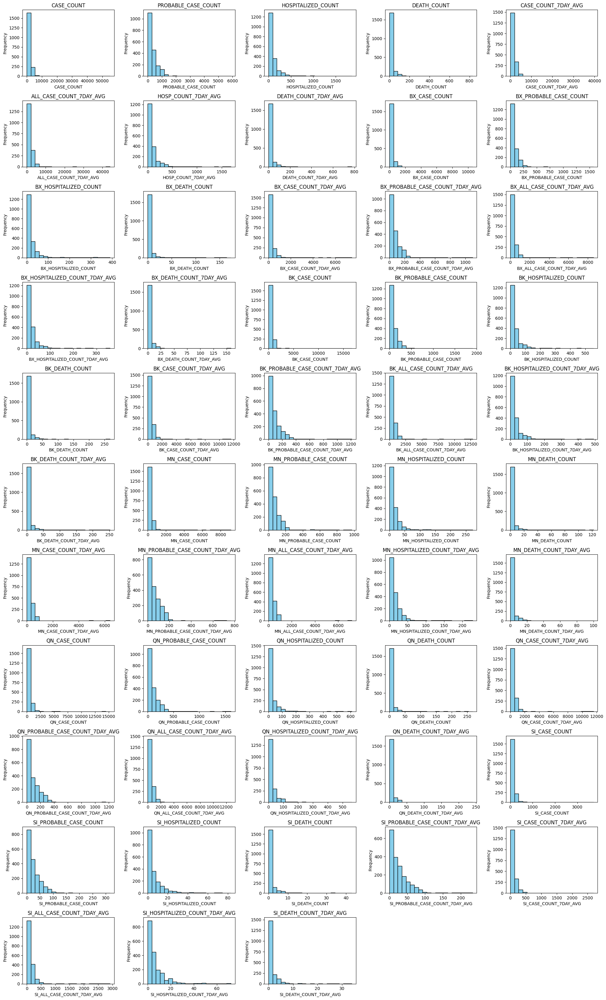

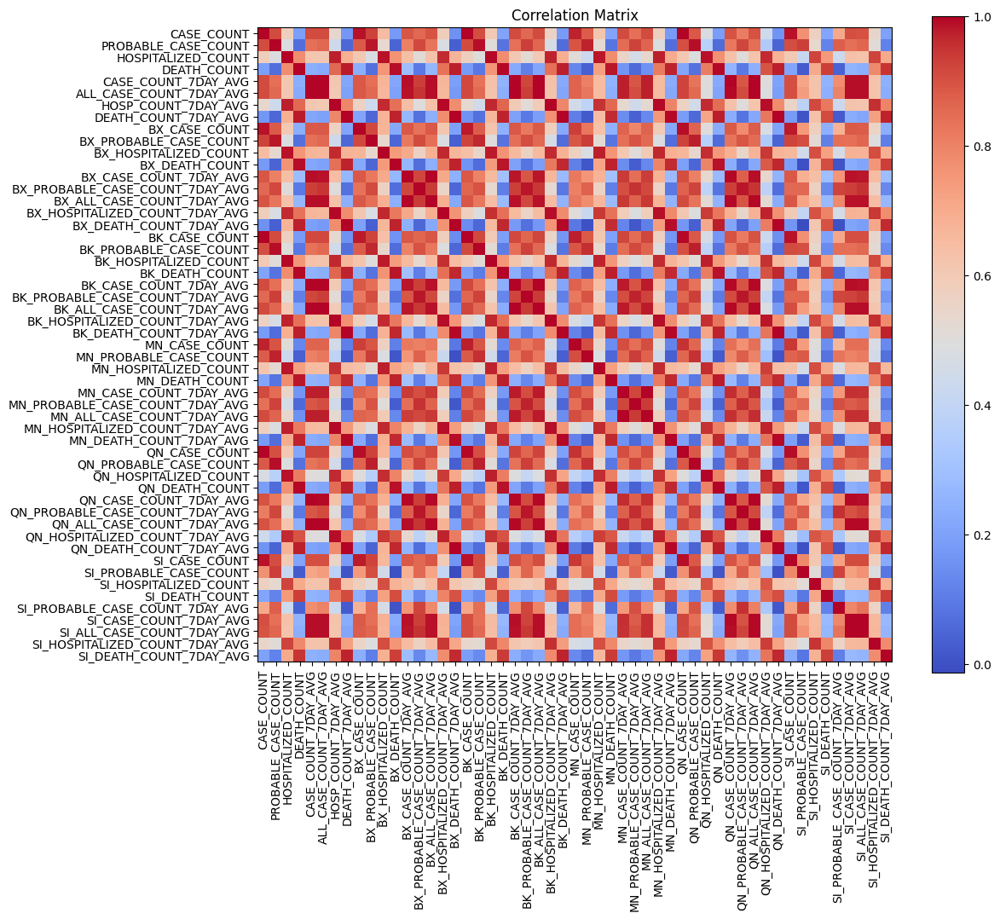

In [12]:
# Analyze data types
print("Data Types:\n", coviddaily_df.dtypes)

# Identify and count missing values
missing_values = coviddaily_df.isnull().sum()
print("\nMissing Values:\n", missing_values)

# Calculate descriptive statistics for numerical variables
numerical_cols = coviddaily_df.select_dtypes(include=["number"]).columns
descriptive_stats = coviddaily_df[numerical_cols].describe()
print("\nDescriptive Statistics for Numerical Variables:\n", descriptive_stats)

# Adjust figure size and subplot grid to accommodate all features
num_cols = len(numerical_cols)
rows = (num_cols + 4) // 5  # Ensure enough rows
plt.figure(figsize=(20, rows * 3))  # Adjust height based on rows

for i, col in enumerate(numerical_cols):
    plt.subplot(rows, 5, i + 1)  # Correct subplot indexing
    plt.hist(coviddaily_df[col], bins=20, color="skyblue", edgecolor="black")
    plt.title(col)
    plt.xlabel(col)
    plt.ylabel("Frequency")
plt.tight_layout()
plt.show()


# Calculate and visualize the correlation matrix
correlation_matrix = coviddaily_df[numerical_cols].corr()
plt.figure(figsize=(12, 10))
plt.imshow(correlation_matrix, cmap="coolwarm", interpolation="nearest")
plt.colorbar()
plt.xticks(range(len(numerical_cols)), numerical_cols, rotation=90)
plt.yticks(range(len(numerical_cols)), numerical_cols)
plt.title("Correlation Matrix")
plt.show()

## Data analysis

### Subtask:
Perform univariate, bivariate, and multivariate analysis on the cleaned COVID-19 dataset.


**Reasoning**:
Perform univariate, bivariate, and multivariate analysis on the cleaned COVID-19 dataset. Calculate descriptive statistics, create histograms and box plots for univariate analysis. Calculate correlation coefficients and create scatter plots for bivariate analysis. Visualize the correlation matrix using a heatmap for multivariate analysis. Document observations.



Descriptive Statistics:
          CASE_COUNT  PROBABLE_CASE_COUNT  HOSPITALIZED_COUNT  DEATH_COUNT  \
count   1915.000000          1915.000000         1915.000000  1915.000000   
mean    1578.584856           369.040731          117.544125    24.652219   
std     3931.913730           506.437319          198.681794    77.643918   
min        0.000000             0.000000            1.000000     0.000000   
25%      262.000000            94.000000           31.000000     2.000000   
50%      605.000000           229.000000           57.000000     6.000000   
75%     1750.500000           478.500000          121.000000    16.000000   
max    55058.000000          5881.000000         1858.000000   831.000000   

       CASE_COUNT_7DAY_AVG  ALL_CASE_COUNT_7DAY_AVG  HOSP_COUNT_7DAY_AVG  \
count          1915.000000              1915.000000          1915.000000   
mean           1578.385901              1947.302872           117.523760   
std            3633.475174              4072.859370  

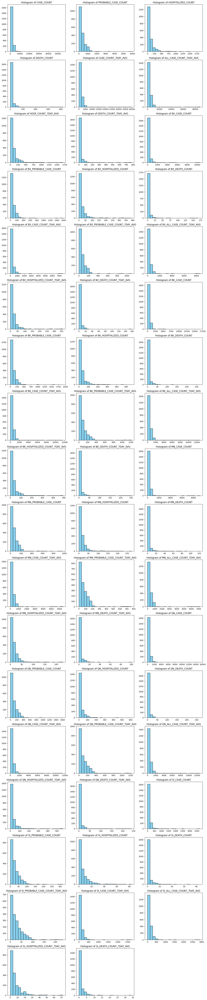

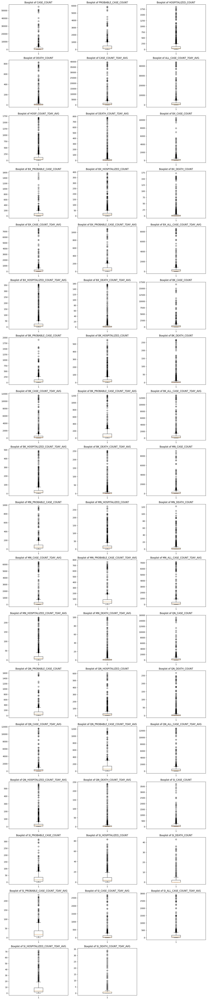

Generando pairplot para columnas: ['CASE_COUNT', 'PROBABLE_CASE_COUNT', 'HOSPITALIZED_COUNT', 'DEATH_COUNT', 'CASE_COUNT_7DAY_AVG']


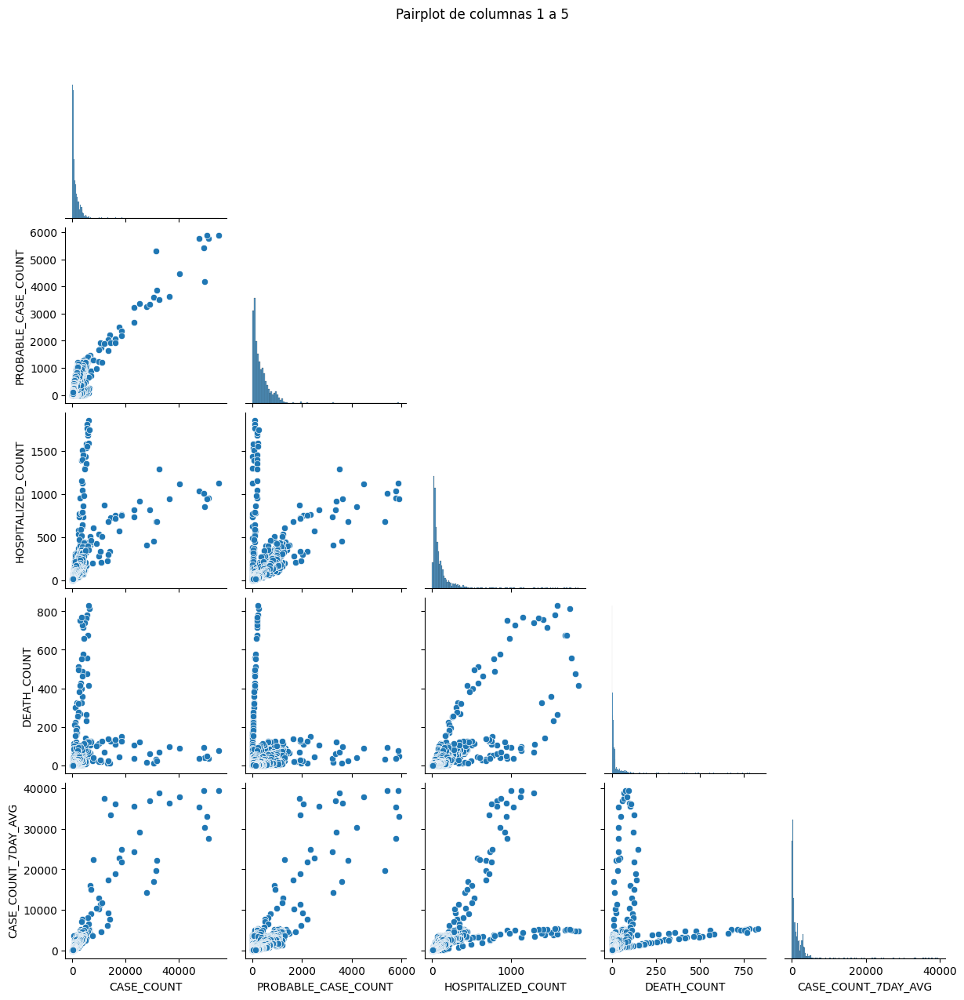

Generando pairplot para columnas: ['ALL_CASE_COUNT_7DAY_AVG', 'HOSP_COUNT_7DAY_AVG', 'DEATH_COUNT_7DAY_AVG', 'BX_CASE_COUNT', 'BX_PROBABLE_CASE_COUNT']


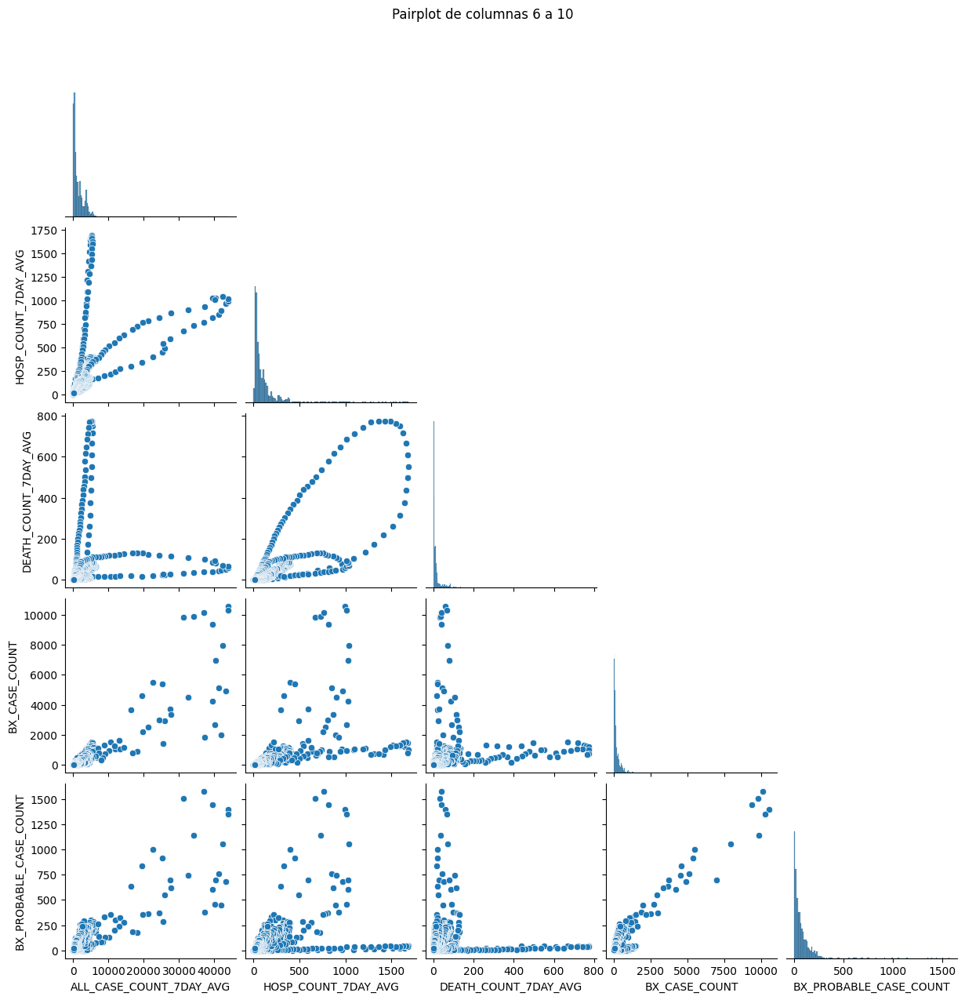

Generando pairplot para columnas: ['BX_HOSPITALIZED_COUNT', 'BX_DEATH_COUNT', 'BX_CASE_COUNT_7DAY_AVG', 'BX_PROBABLE_CASE_COUNT_7DAY_AVG', 'BX_ALL_CASE_COUNT_7DAY_AVG']


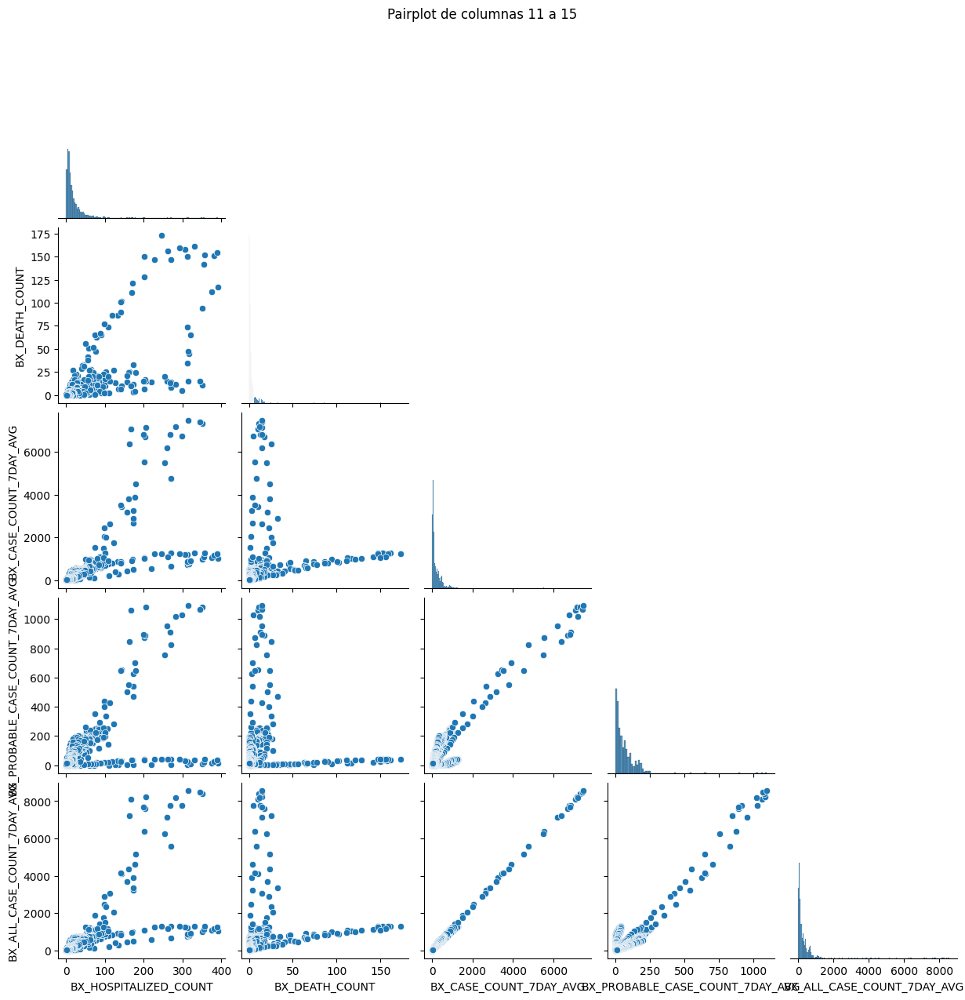

Generando pairplot para columnas: ['BX_HOSPITALIZED_COUNT_7DAY_AVG', 'BX_DEATH_COUNT_7DAY_AVG', 'BK_CASE_COUNT', 'BK_PROBABLE_CASE_COUNT', 'BK_HOSPITALIZED_COUNT']


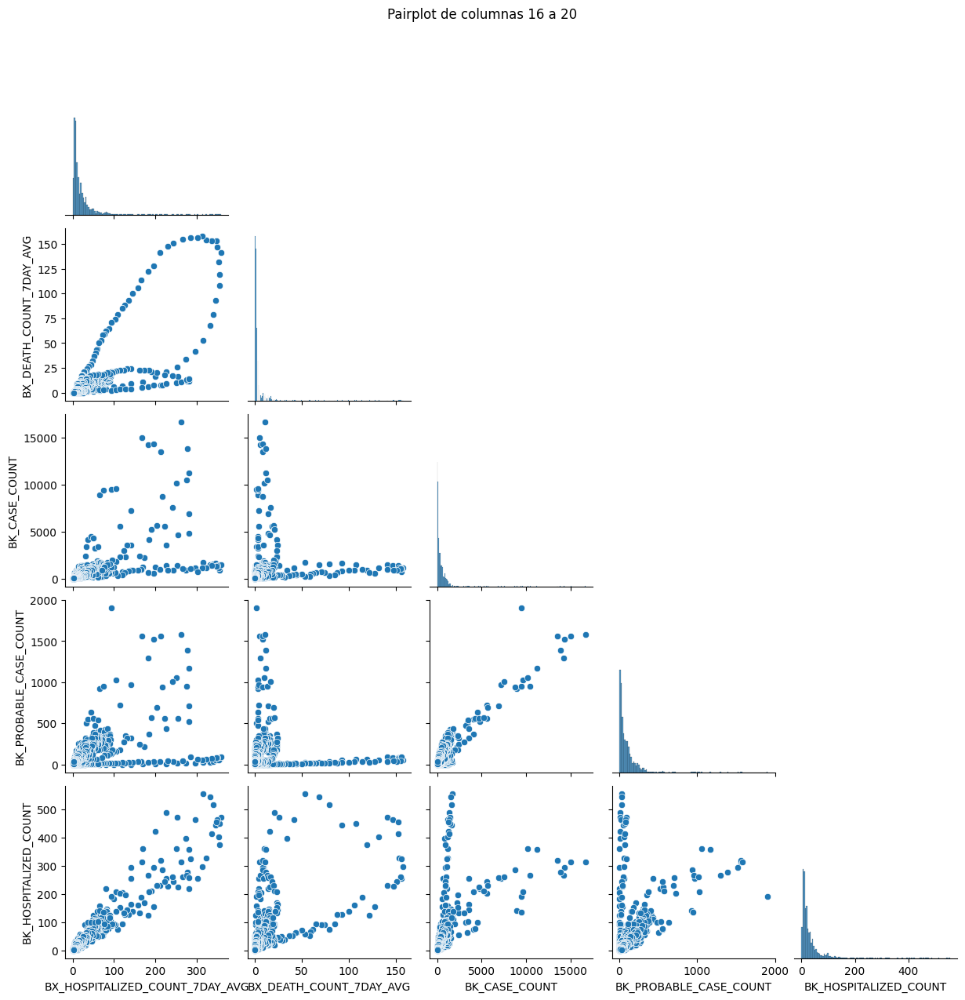

Generando pairplot para columnas: ['BK_DEATH_COUNT', 'BK_CASE_COUNT_7DAY_AVG', 'BK_PROBABLE_CASE_COUNT_7DAY_AVG', 'BK_ALL_CASE_COUNT_7DAY_AVG', 'BK_HOSPITALIZED_COUNT_7DAY_AVG']


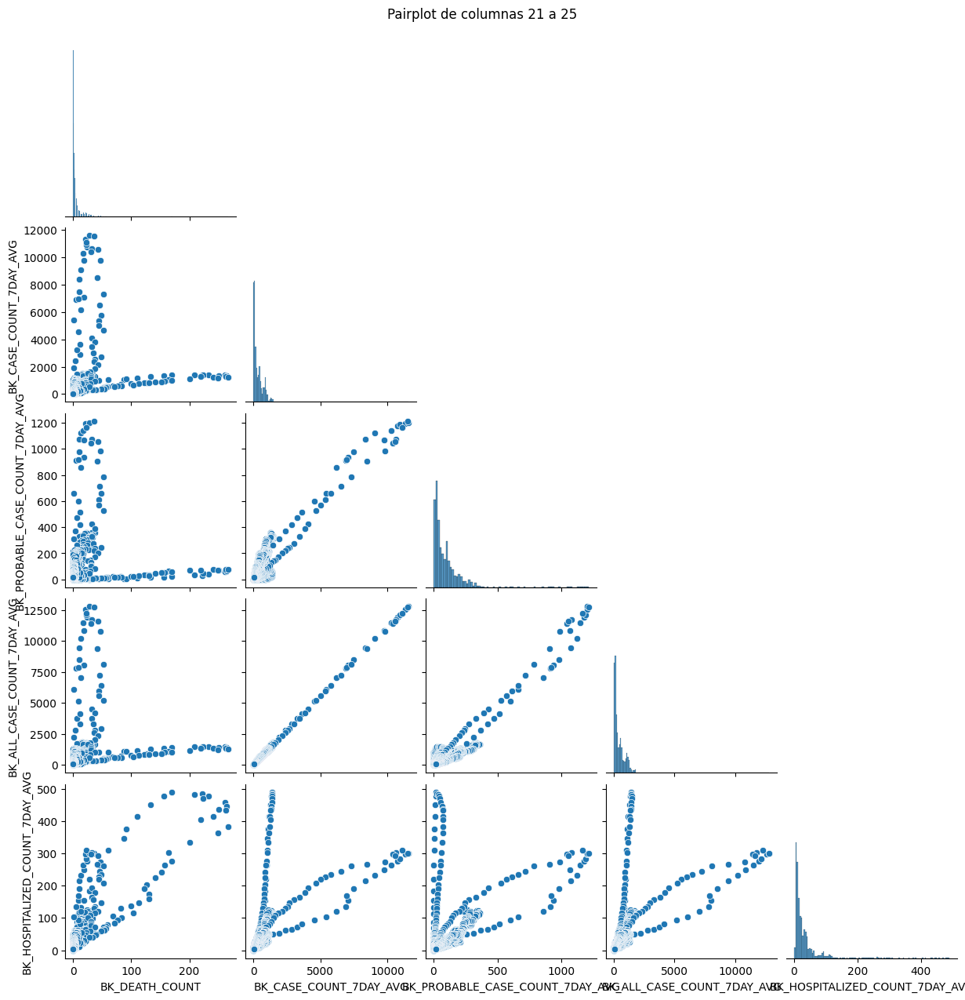

Generando pairplot para columnas: ['BK_DEATH_COUNT_7DAY_AVG', 'MN_CASE_COUNT', 'MN_PROBABLE_CASE_COUNT', 'MN_HOSPITALIZED_COUNT', 'MN_DEATH_COUNT']


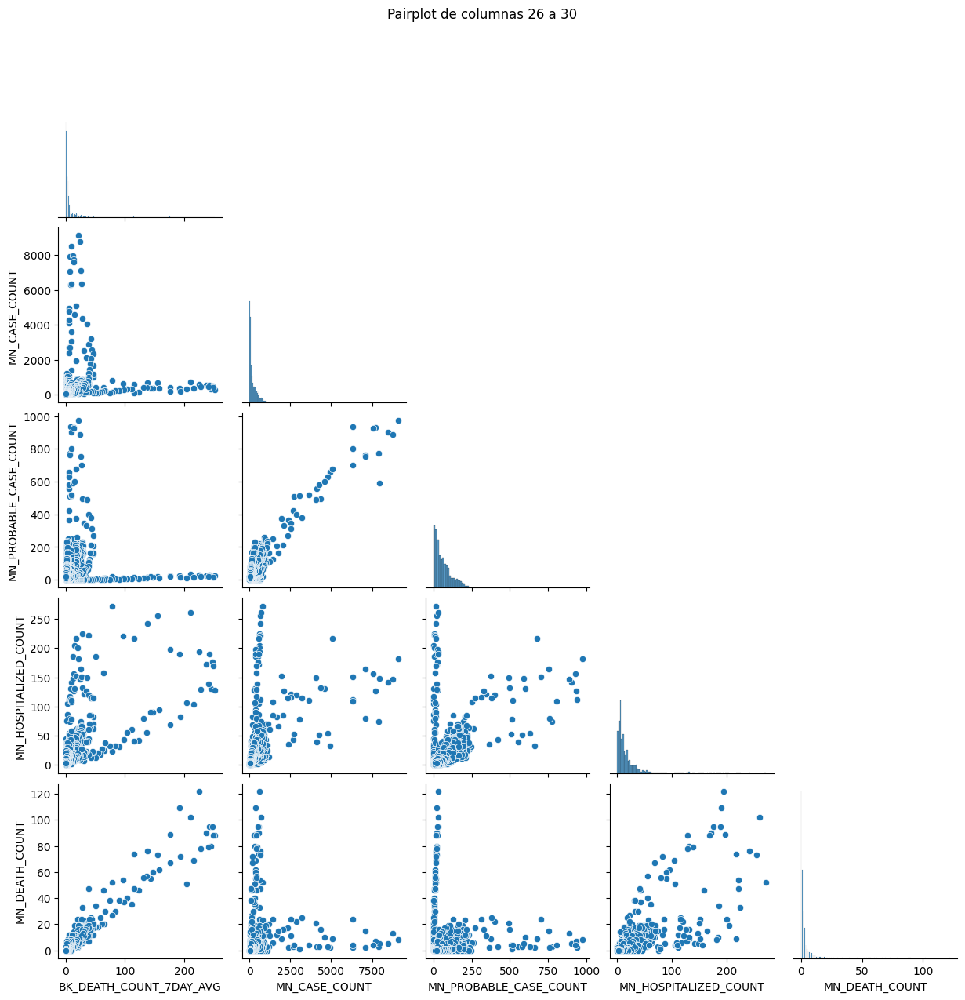

Generando pairplot para columnas: ['MN_CASE_COUNT_7DAY_AVG', 'MN_PROBABLE_CASE_COUNT_7DAY_AVG', 'MN_ALL_CASE_COUNT_7DAY_AVG', 'MN_HOSPITALIZED_COUNT_7DAY_AVG', 'MN_DEATH_COUNT_7DAY_AVG']


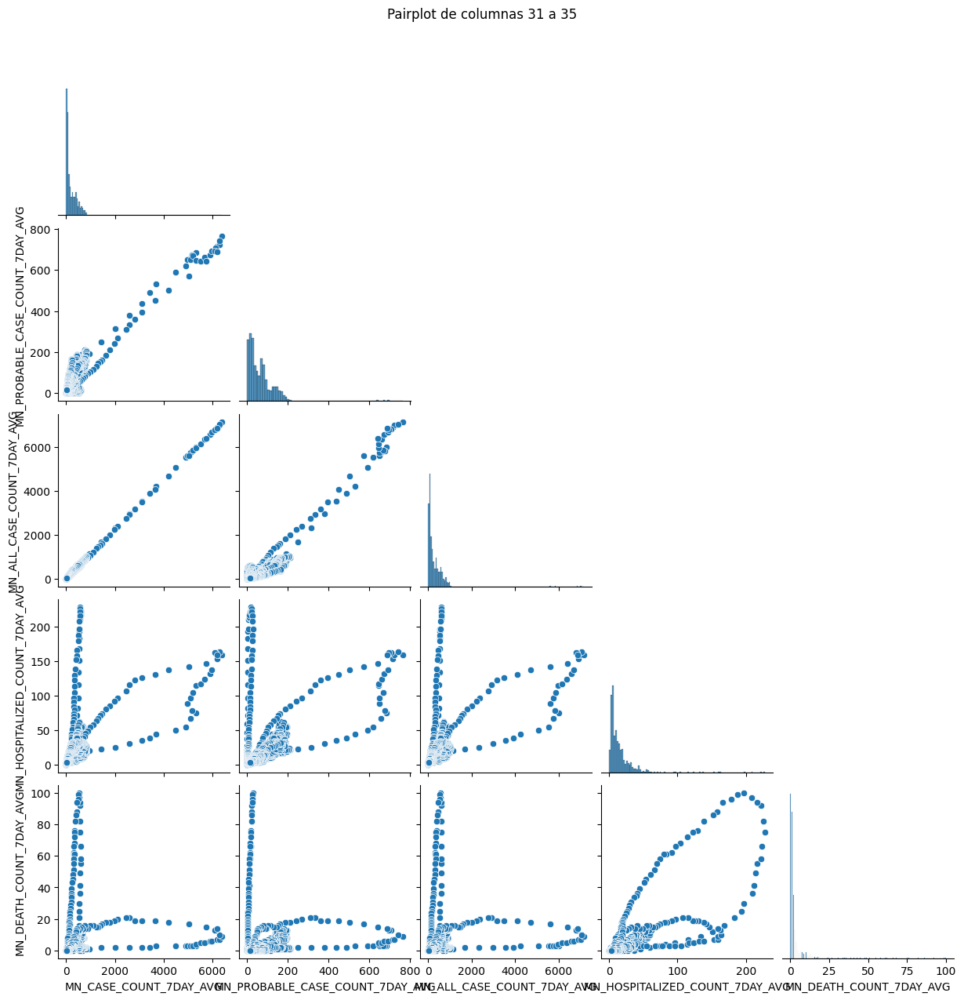

Generando pairplot para columnas: ['QN_CASE_COUNT', 'QN_PROBABLE_CASE_COUNT', 'QN_HOSPITALIZED_COUNT', 'QN_DEATH_COUNT', 'QN_CASE_COUNT_7DAY_AVG']


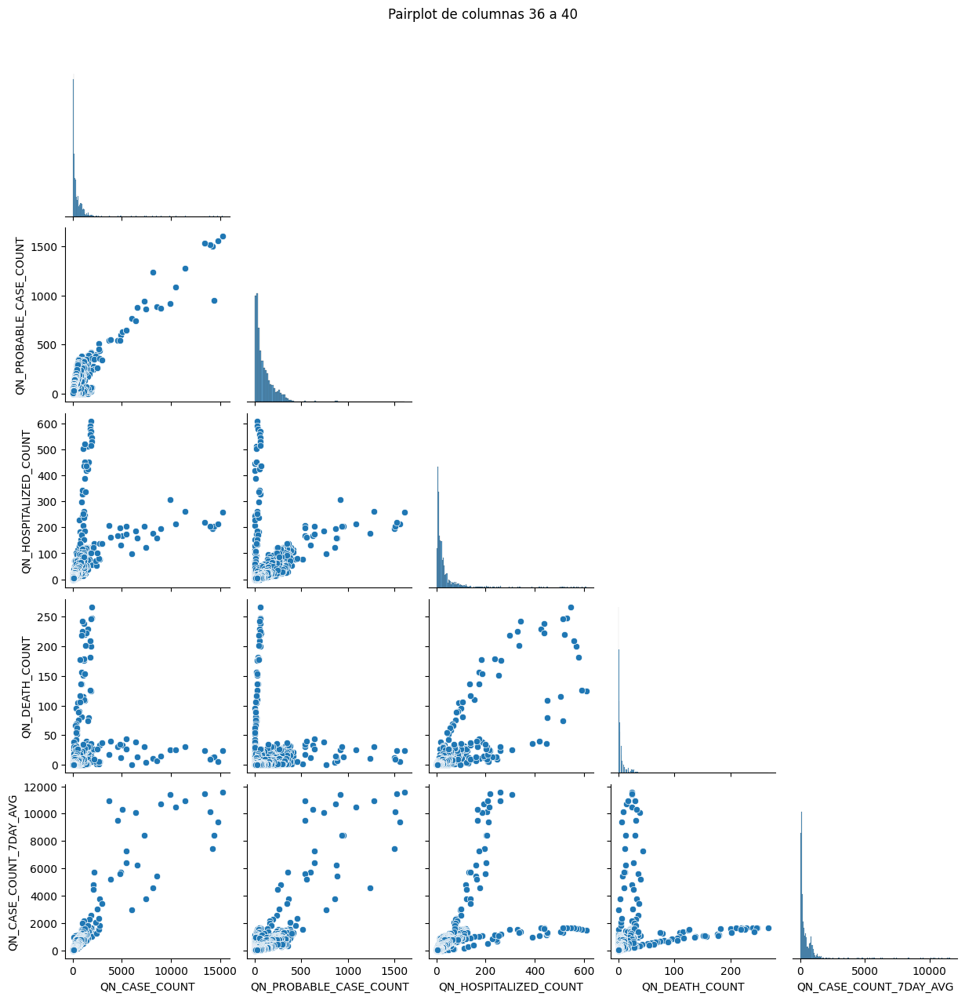

Generando pairplot para columnas: ['QN_PROBABLE_CASE_COUNT_7DAY_AVG', 'QN_ALL_CASE_COUNT_7DAY_AVG', 'QN_HOSPITALIZED_COUNT_7DAY_AVG', 'QN_DEATH_COUNT_7DAY_AVG', 'SI_CASE_COUNT']


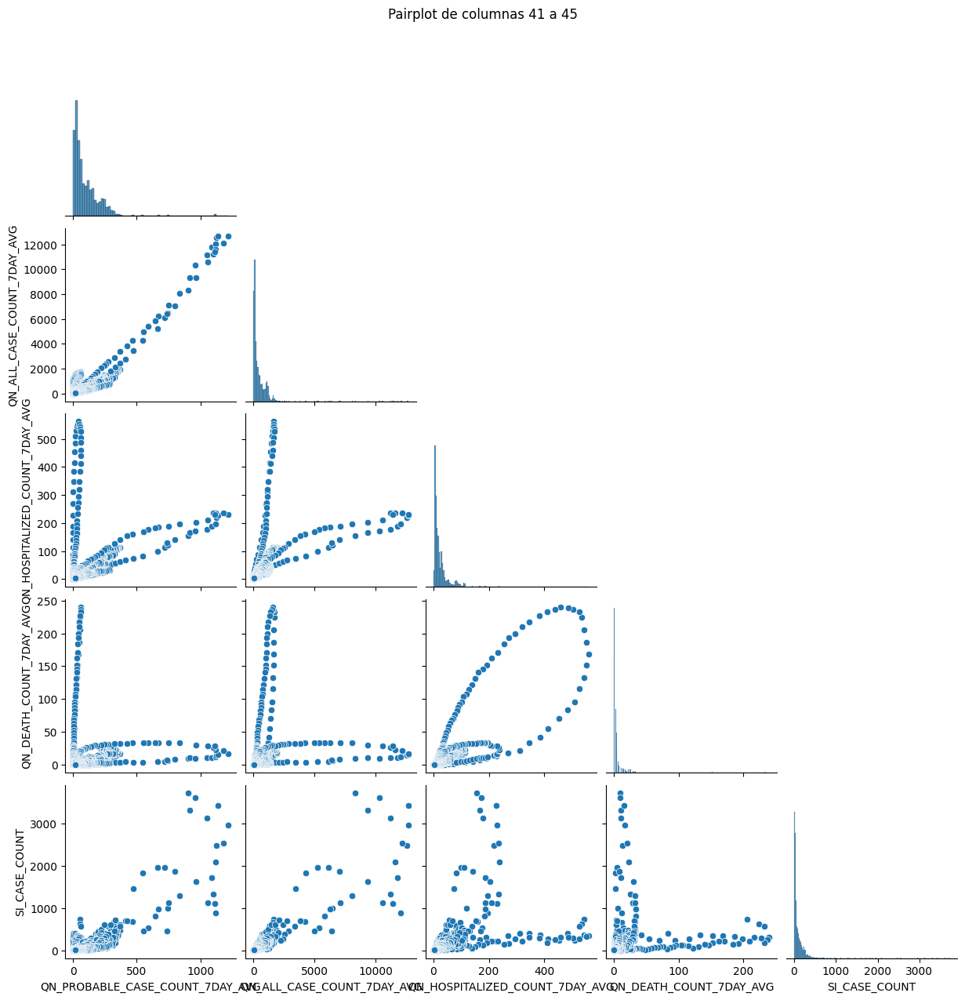

Generando pairplot para columnas: ['SI_PROBABLE_CASE_COUNT', 'SI_HOSPITALIZED_COUNT', 'SI_DEATH_COUNT', 'SI_PROBABLE_CASE_COUNT_7DAY_AVG', 'SI_CASE_COUNT_7DAY_AVG']


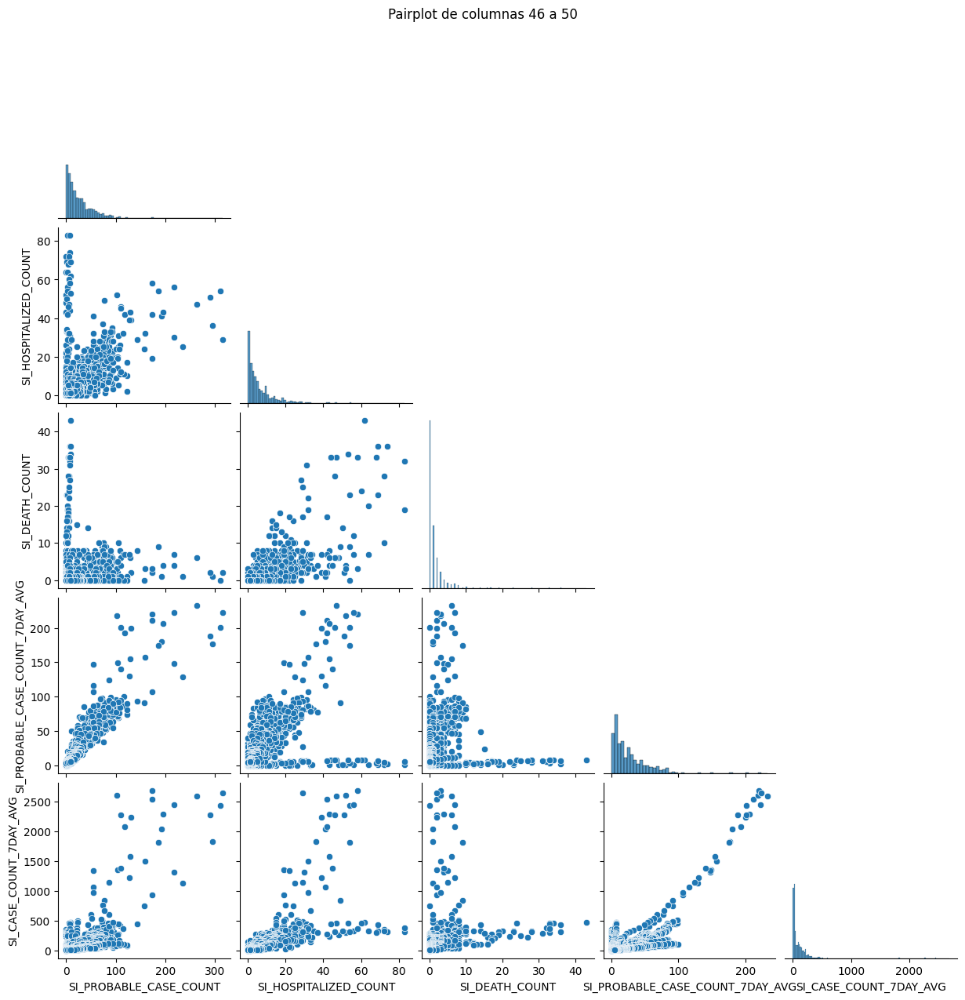

Generando pairplot para columnas: ['SI_ALL_CASE_COUNT_7DAY_AVG', 'SI_HOSPITALIZED_COUNT_7DAY_AVG', 'SI_DEATH_COUNT_7DAY_AVG']


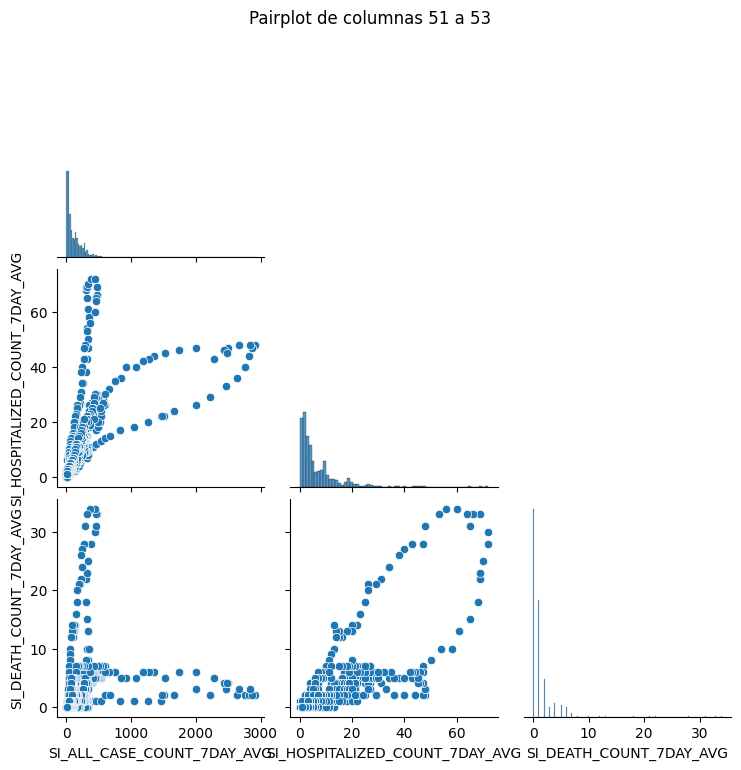

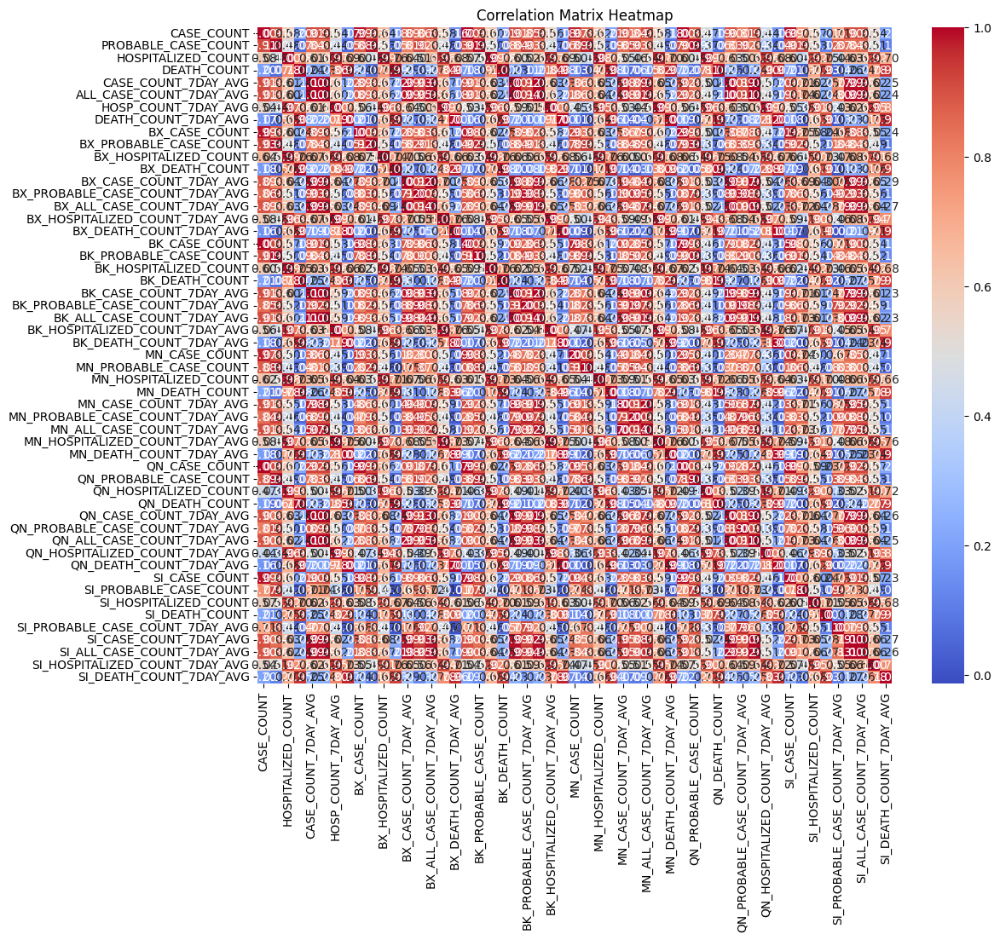

In [13]:
# Univariate Analysis
numerical_cols = coviddaily_df.select_dtypes(include=["number"]).columns
descriptive_stats = coviddaily_df[numerical_cols].describe()
print("Descriptive Statistics:\n", descriptive_stats)

# Histograms
cols = 3
rows = math.ceil(len(numerical_cols) / cols)
fig, axes = plt.subplots(rows, cols, figsize=(cols * 5, rows * 4))
axes = axes.flatten()

for i, col in enumerate(numerical_cols):
    axes[i].hist(coviddaily_df[col].dropna(), bins=20, color="skyblue", edgecolor="black")
    axes[i].set_title(f"Histogram of {col}")

# Quitar subplots vacíos si sobran
for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])

plt.tight_layout()
plt.show()

# Boxplots
fig, axes = plt.subplots(rows, cols, figsize=(cols * 5, rows * 4))
axes = axes.flatten()

for i, col in enumerate(numerical_cols):
    axes[i].boxplot(coviddaily_df[col].dropna(), vert=True)
    axes[i].set_title(f"Boxplot of {col}")

for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])

plt.tight_layout()
plt.show()

# Bivariate Analysis con Pairwise scatter plots en bloques
block_size = 5  # Ajusta si quieres ver más o menos columnas por bloque
for i in range(0, len(numerical_cols), block_size):
    sub_cols = numerical_cols[i : i + block_size]
    print(f"Generando pairplot para columnas: {list(sub_cols)}")
    sns.pairplot(coviddaily_df[sub_cols].dropna(), corner=True)
    plt.suptitle(f"Pairplot de columnas {i + 1} a {i + len(sub_cols)}", y=1.02)
    plt.show()

# Multivariate Analysis con Heatmap
correlation_matrix = coviddaily_df[numerical_cols].corr()
plt.figure(figsize=(12, 10))
sns.heatmap(correlation_matrix, annot=True, cmap="coolwarm", fmt=".2f")
plt.title("Correlation Matrix Heatmap")
plt.show()

## Data visualization

### Subtask:
Visualize the results of the data analysis.


**Reasoning**:
Create histograms, box plots, scatter plots, and a heatmap to visualize the data analysis results.



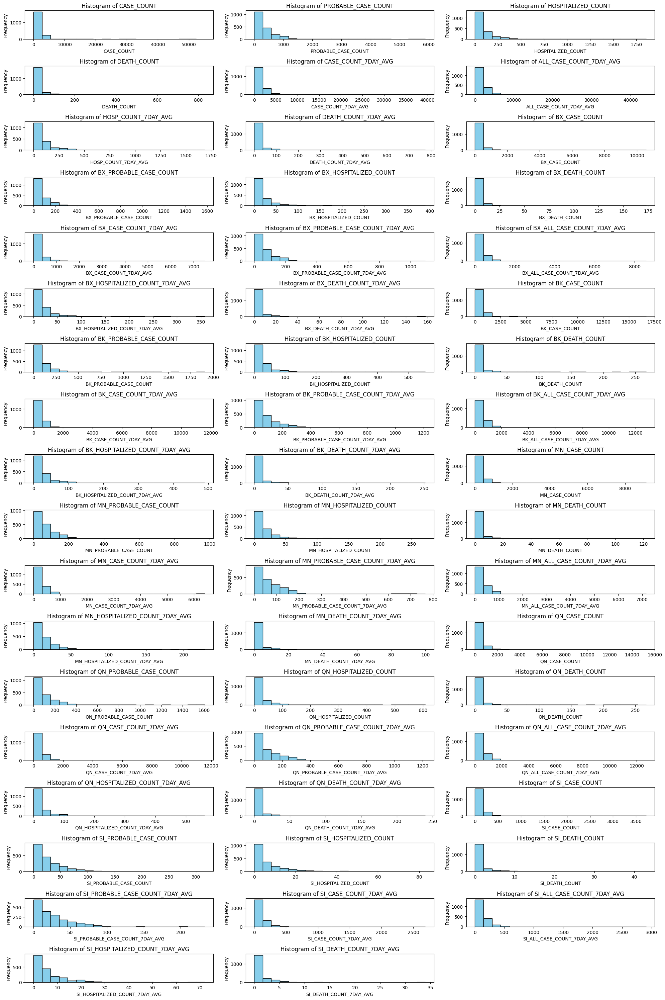

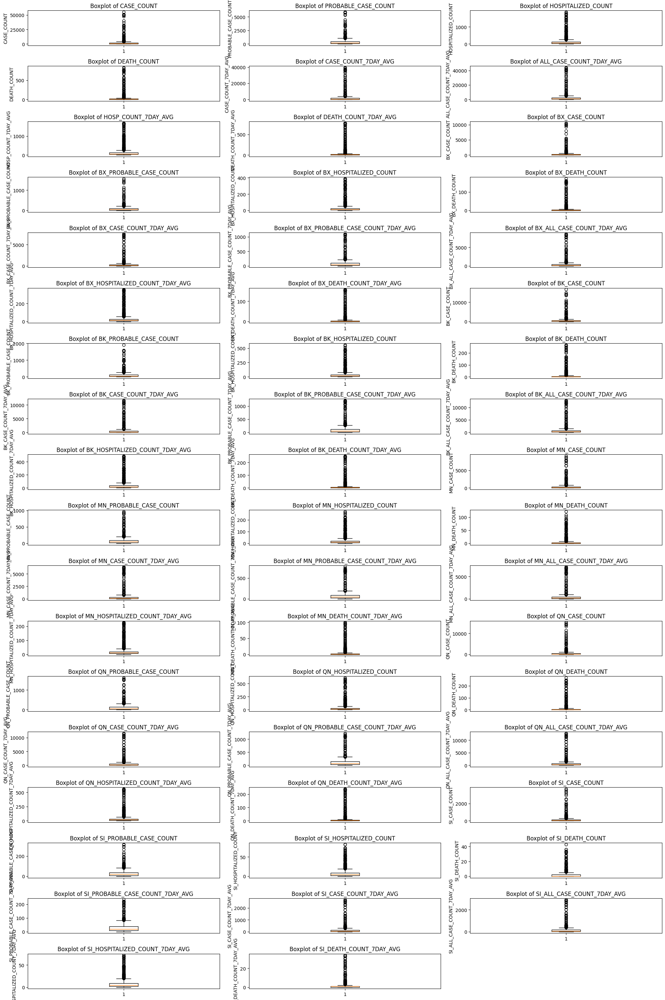

Top correlaciones:
BK_CASE_COUNT_7DAY_AVG vs BK_ALL_CASE_COUNT_7DAY_AVG → Corr = 1.00
DEATH_COUNT_7DAY_AVG vs QN_DEATH_COUNT_7DAY_AVG → Corr = 1.00
CASE_COUNT_7DAY_AVG vs BK_CASE_COUNT_7DAY_AVG → Corr = 1.00
ALL_CASE_COUNT_7DAY_AVG vs BK_ALL_CASE_COUNT_7DAY_AVG → Corr = 1.00
MN_CASE_COUNT_7DAY_AVG vs MN_ALL_CASE_COUNT_7DAY_AVG → Corr = 1.00
CASE_COUNT_7DAY_AVG vs ALL_CASE_COUNT_7DAY_AVG → Corr = 1.00


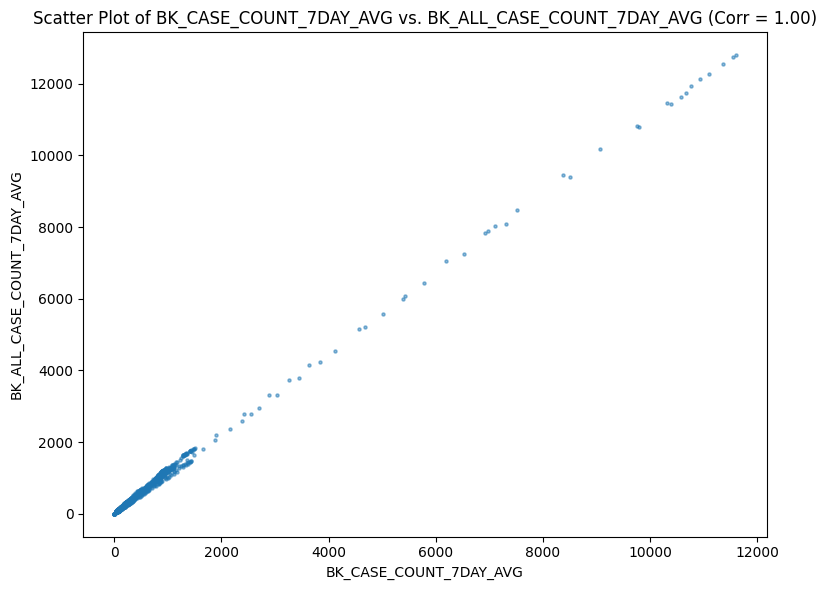

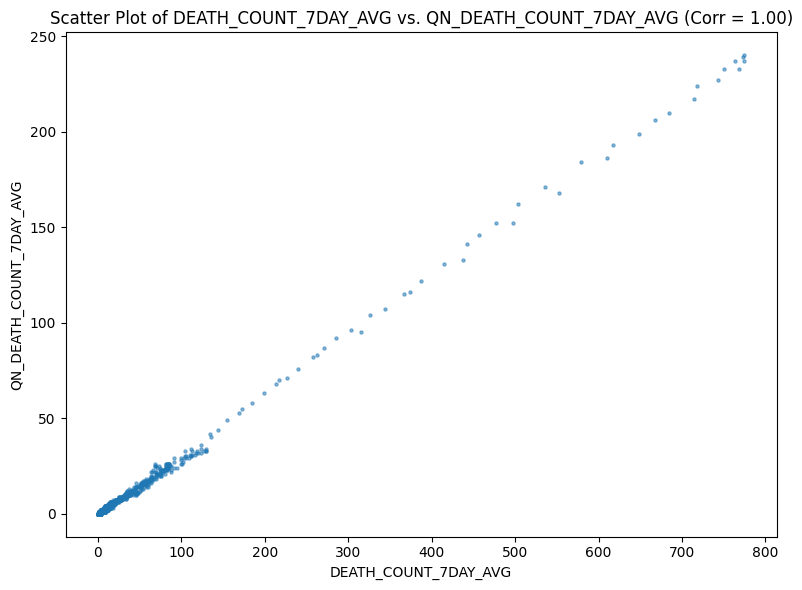

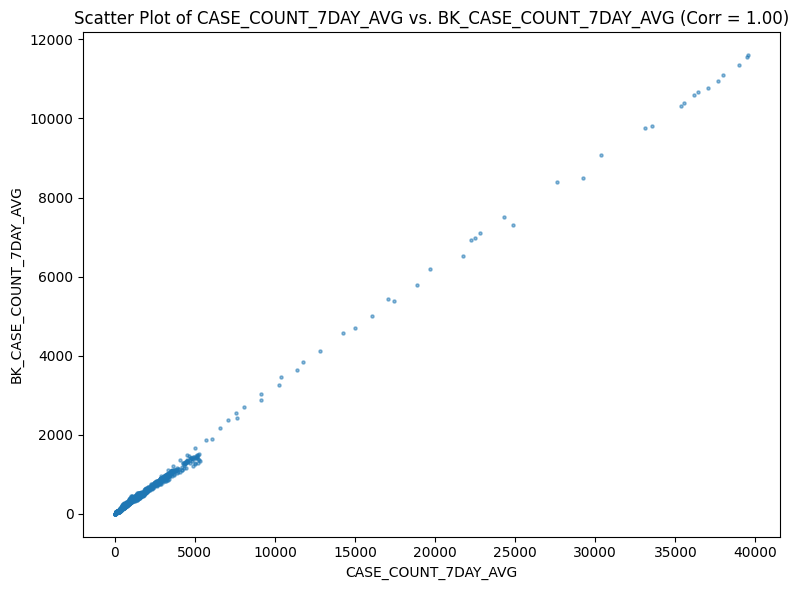

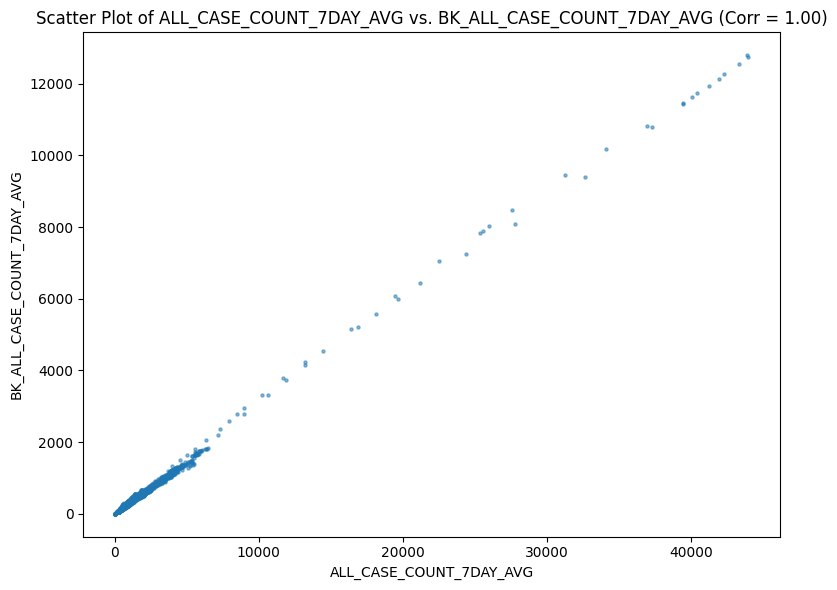

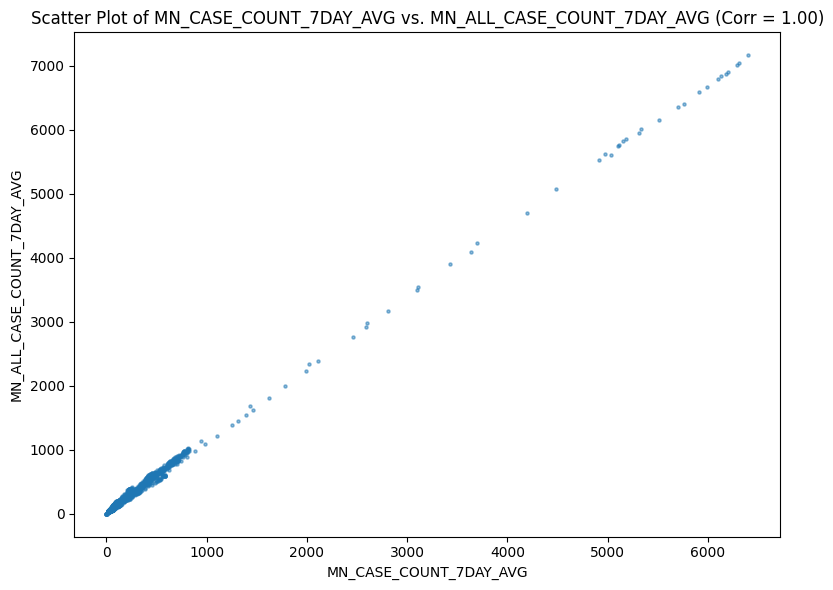

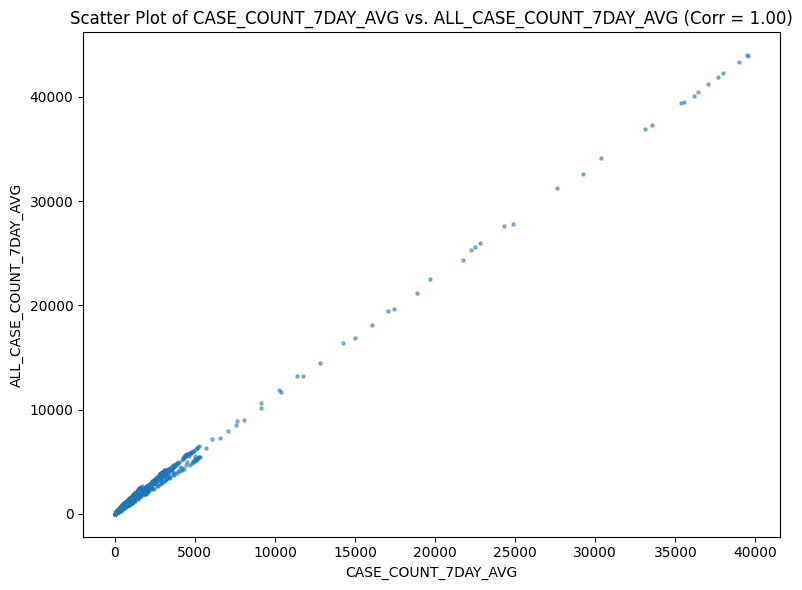

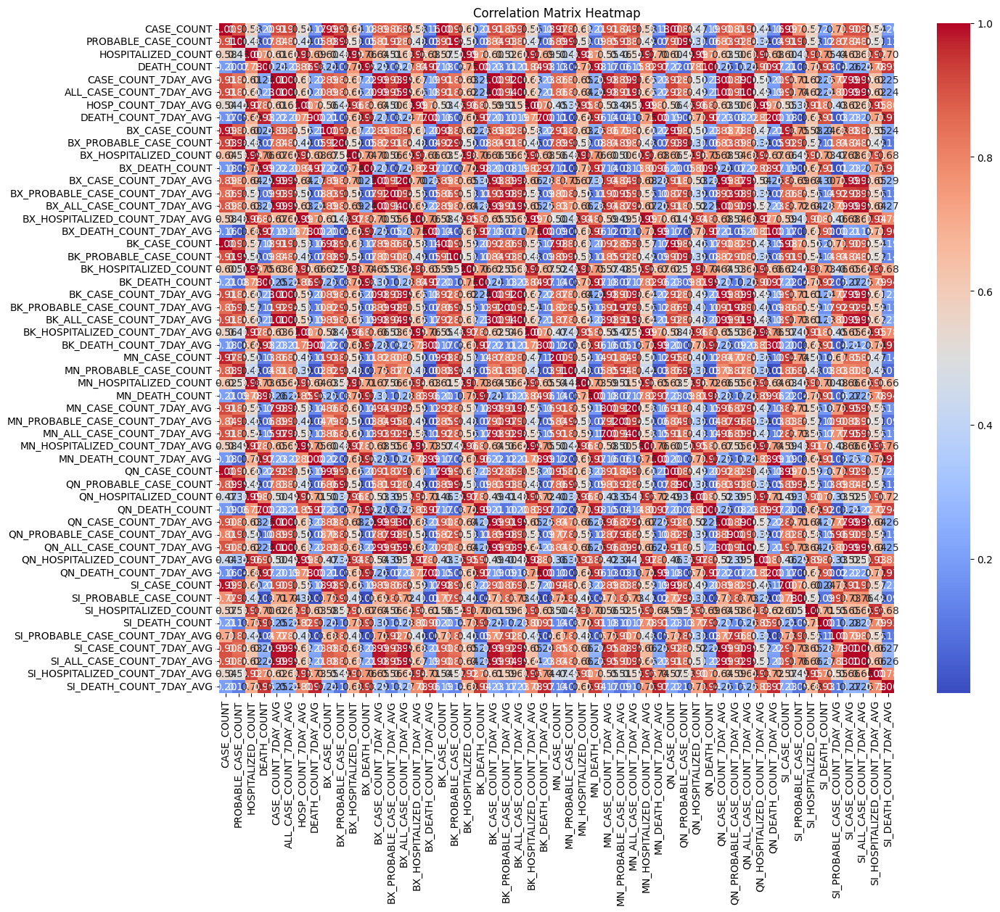

In [14]:
# Selección de columnas numéricas
numerical_cols = coviddaily_df.select_dtypes(include=["number"]).columns

# Histograms
plt.figure(figsize=(20, 30))  # Increased figure size
for i, col in enumerate(numerical_cols):
    plt.subplot(len(numerical_cols) // 3 + 1, 3, i + 1)
    plt.hist(coviddaily_df[col].dropna(), bins=20, color="skyblue", edgecolor="black")
    plt.title(f"Histogram of {col}")
    plt.xlabel(col)
    plt.ylabel("Frequency")
plt.tight_layout()
plt.show()

# Box plots
plt.figure(figsize=(20, 30))  # Increased figure size
for i, col in enumerate(numerical_cols):
    plt.subplot(len(numerical_cols) // 3 + 1, 3, i + 1)
    plt.boxplot(coviddaily_df[col].dropna())
    plt.title(f"Boxplot of {col}")
    plt.ylabel(col)
plt.tight_layout()
plt.show()

# Scatter plots, solo los 6 pares más correlacionados
correlation_matrix = coviddaily_df[numerical_cols].corr().abs()

# Obtener pares únicos más correlacionados (triángulo superior)
correlation_pairs = (
    correlation_matrix.where(np.triu(np.ones(correlation_matrix.shape), k=1).astype(bool))
    .stack()
    .sort_values(ascending=False)
)

top_n = 6
top_pairs = correlation_pairs.head(top_n).index.tolist()

# Mostrar las correlaciones seleccionadas
print("Top correlaciones:")
for x, y in top_pairs:
    print(f"{x} vs {y} → Corr = {correlation_matrix.loc[x, y]:.2f}")

# Graficar solo esos pares
for x_col, y_col in top_pairs:
    plt.figure(figsize=(8, 6))
    plt.scatter(coviddaily_df[x_col], coviddaily_df[y_col], alpha=0.5, s=5)
    plt.xlabel(x_col)
    plt.ylabel(y_col)
    plt.title(
        f"Scatter Plot of {x_col} vs. {y_col} (Corr = {correlation_matrix.loc[x_col, y_col]:.2f})"
    )
    plt.tight_layout()
    plt.show()

# Heatmap of the correlation matrix
plt.figure(figsize=(15, 12))  # Increased figure size
sns.heatmap(correlation_matrix, annot=True, cmap="coolwarm", fmt=".2f")
plt.title("Correlation Matrix Heatmap")
plt.show()

## Summary:

### Q&A
No questions were posed in the task description.

### Data Analysis Key Findings
* The 'INCOMPLETE' column was removed from the dataset.
* The 'date of interest' column's data type was successfully converted to datetime objects.
* No missing values were found in the dataset after cleaning.
* Histograms and box plots were generated for each numerical feature to visualize their distributions and identify potential outliers.
* A correlation matrix heatmap was created to visualize the relationships between numerical features.  Strong positive correlations were observed between various case counts, but specific numerical values and detailed interpretations are not included in the provided summary.

### Insights or Next Steps
* Investigate the potential outliers identified in the box plots and their impact on the analysis.
* Explore non-linear relationships between variables using more advanced visualization techniques or statistical methods.
